In [1]:
# Basic libraries
import numpy as np
import math
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import pandas as pd
import time

# Persistence homology
import gudhi
from persim import plot_diagrams, bottleneck, PersistenceImager
from persim.images_weights import linear_ramp
from ripser import ripser

# Dim reduction
from sklearn.decomposition import PCA

# Clustering
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering as agclust

# Data preparation

## Load data

9 samples of cell spatial distribution from mouse spleen:
- 3 __healthy__ samples: BALB-1, BALBc-2, BALBc-3
- 6 samples from spleen with __lupus (autoimmune disease)__, by stage:
    - MRL-4, -5, -6: early
    - MRL-7, -8: intermediate
    - MRL-9: late

Each sample is divided in 7 x 9 tiles (7 horizontal, 9 vertical):
Each row of the data set contains the information of a single cell. The relevant columns are:
- ```Imaging phenotype cluster ID```: code that identifies the type of cell. List of cell types and their respective codes is taken from mm2.xlsx.
- ```sample_Xtile_Ytile```: sample and tile position, e.g. BALBc-2_X02_Y08
- ```X.X```: x-coordinate of the cell
- ```Y.Y```: x-coordinate of the cell

In [2]:
df_cells = pd.read_csv('data/MRLdatasetexpression.csv', index_col = None) # Data
df_mmc = pd.read_excel('data/mmc2.xlsx') # Cell type corresponding to each Imaging phenotype cluster ID

/Users/mariatorrasperez/miniconda3/envs/tda/lib/python3.9/site-packages/openpyxl/worksheet/_reader.py:312: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)


In [3]:
# Find the list of names of samples. 9 samples:
indices = df_cells.sample_Xtile_Ytile.value_counts().index.tolist()
samples = sorted(list(set([item.split("_")[0] for item in indices]))) # Alphabetically sorted

# Find the list of ID, except some types of cells which we discard. 25 cell types:
notincluded = ['dirt','noid','capsule']
cell_types = df_mmc[~df_mmc["Imaging phenotype (cell type)"].isin(notincluded)]["Imaging phenotype (cell type)"].value_counts().index.tolist()

In [4]:
# Order the cell types by relevance (total number of cells present in the samples)
ct_num = []

for ct in cell_types:
    IDs = df_mmc[df_mmc["Imaging phenotype (cell type)"]==ct]["X-shift cluster ID"].values
    ct_num.append(len(df_cells[(df_cells["Imaging phenotype cluster ID"].isin(IDs))]))

cell_types = [x for _, x in sorted(zip(ct_num, cell_types), key=lambda pair: pair[0],reverse=True)]

## Stitch the tiles together

The code takes 1 minute to run, the object is saved and can be directly loaded instead.

In [6]:
stitched = {}

xtilespan = 1344;
ytilespan = 1008;

for sample in samples:
    for ct in cell_types:
        IDs = df_mmc[df_mmc["Imaging phenotype (cell type)"]==ct]["X-shift cluster ID"].values
        # extract relevant rows
        tile_cells = df_cells[(df_cells['sample_Xtile_Ytile'].str.startswith(sample))
                         & (df_cells["Imaging phenotype cluster ID"].isin(IDs))]
        x_positions = tile_cells['sample_Xtile_Ytile'].str.split("_").str[1].str[2].astype(int).values
        y_positions = tile_cells['sample_Xtile_Ytile'].str.split("_").str[2].str[2].astype(int).values
        
        x = tile_cells["X.X"].values + xtilespan*(x_positions-1)
        y = tile_cells["Y.Y"].values + ytilespan*(y_positions-1)
        
        stitched[sample,ct]=[x,y]

In [7]:
# LOAD PYTHON OBJECT stitched WITH PICKLE
with open('stitched_file', 'rb') as stitched_file:
    stitched = pickle.load(stitched_file)

## Densities

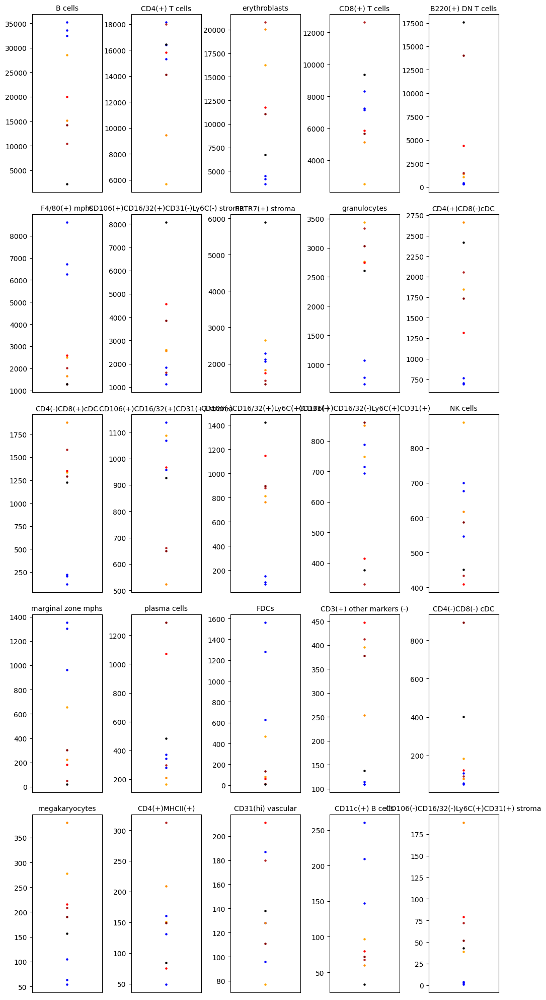

In [8]:
fig, axs = plt.subplots(5, 5, figsize=(10, 20))
fig.tight_layout()

mrl_stages_colors = ['orange','darkorange','red','firebrick','maroon','black']

for i in range(0,25):    
    ct = cell_types[i]
    ax = axs[math.floor(i/5), i%5]
    BALBc_densities = []
    MRL_densities = []
    for sample in samples:
        if sample.startswith('BALBc'):
            BALBc_densities.append(len(stitched[sample,ct][0]))
        else:
            MRL_densities.append(len(stitched[sample,ct][0]))
    ax.scatter(np.zeros(len(BALBc_densities)), BALBc_densities, s=5,color='blue')
    for j in range(0,6):
        ax.scatter([0], [MRL_densities[j]], s=5,color=mrl_stages_colors[j])    
        #ax.scatter(np.zeros(len(MRL_densities)), MRL_densities, s=5,color='red')
    ax.set_title(ct, fontsize=10)
    ax.set_xticks([], [])

## Visualise samples

We begin by plotting each cell type separately. We observe a great variability in density between cell types, in some cases a clear difference is visible between the healthy on the first row and the ill samples.

/var/folders/0q/x6m4m2hd42jgcwb_j4b70blh0000gn/T/ipykernel_998/128419167.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(3, 3, figsize=(6, 6))


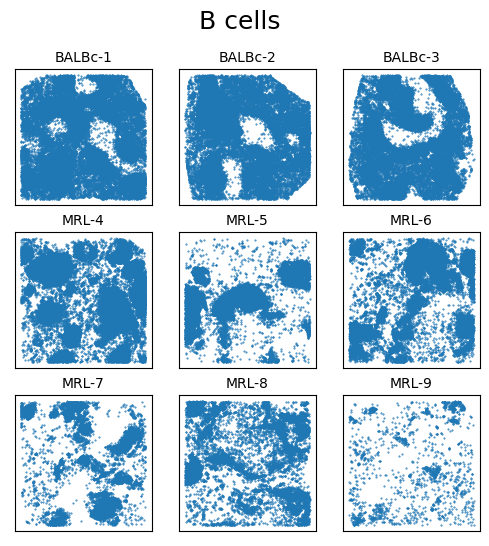

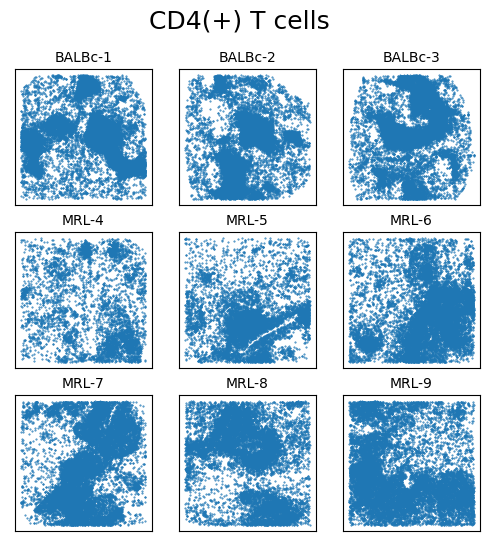

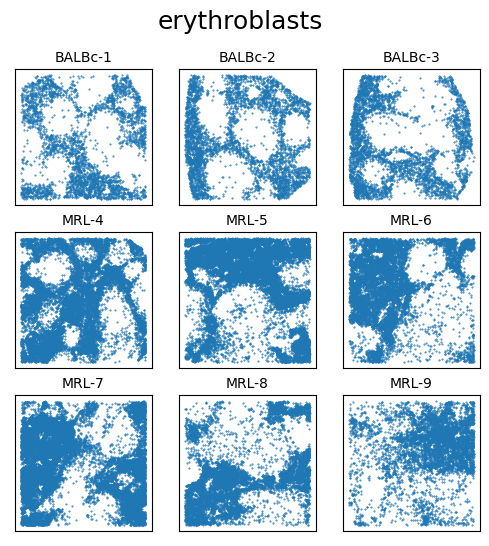

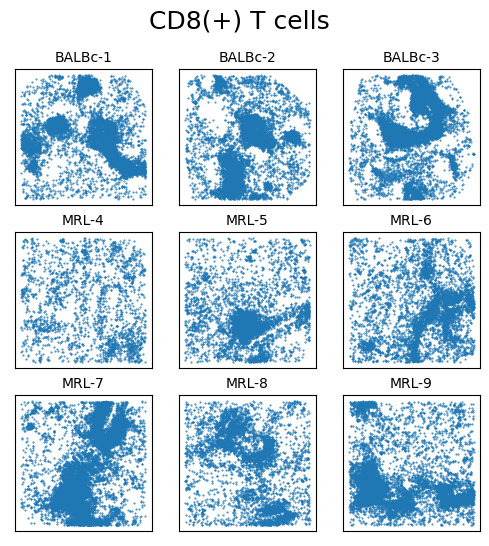

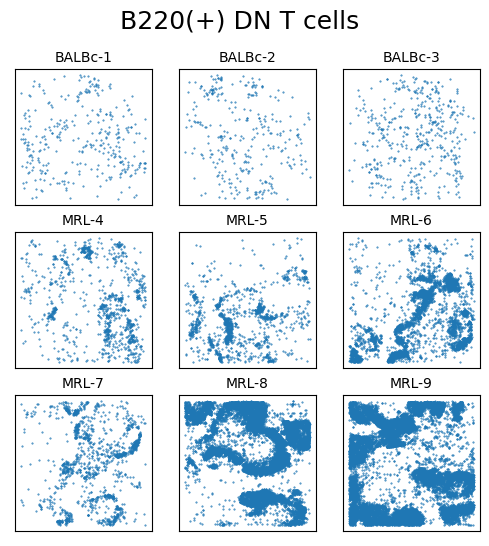

...

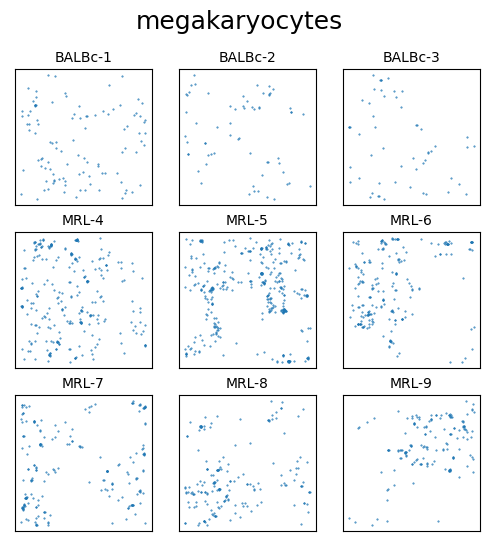

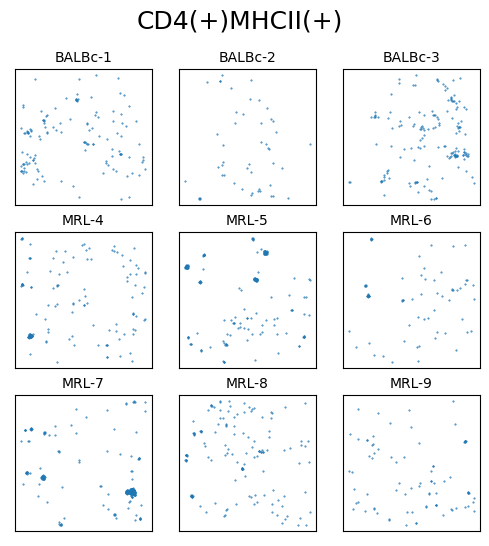

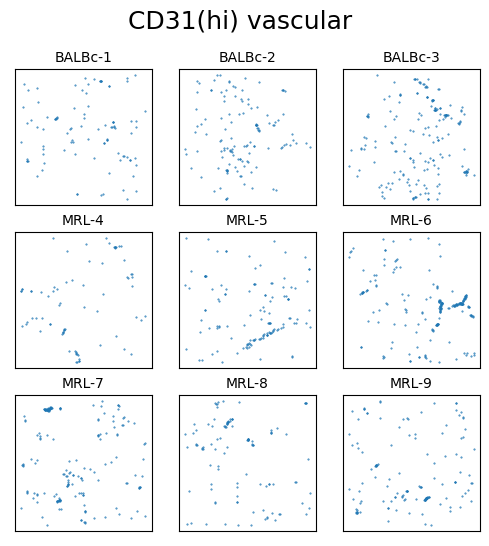

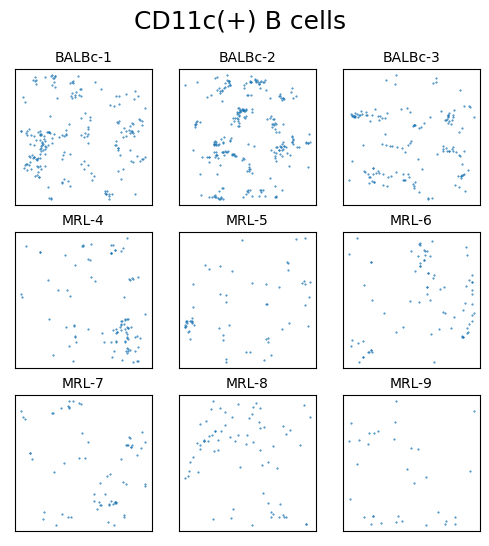

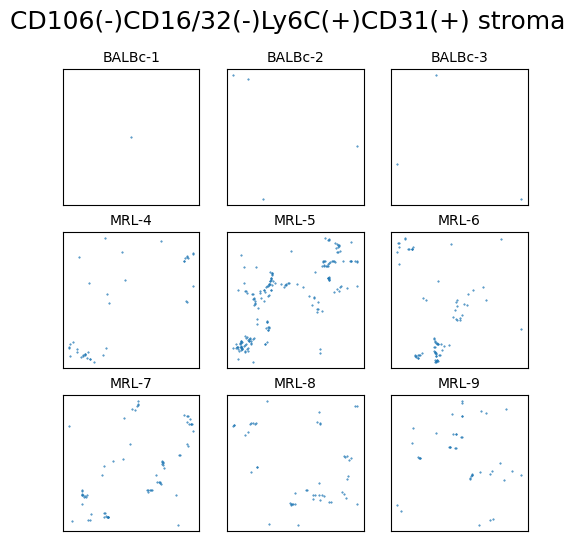

In [9]:
for ct in cell_types:
    
    fig, axs = plt.subplots(3, 3, figsize=(6, 6))
    fig.suptitle(ct, fontsize=18)

    for i in range(0,9):    
        sample = samples[i]
        x = stitched[sample,ct][0]
        y = stitched[sample,ct][1]
        ax = axs[math.floor(i/3), i%3]
        ax.scatter(x, y, label = sample, s=0.2)
        ax.set_title(sample, fontsize=10)
        ax.set_xticks([], []) # Before taking out the ticks I checked all the samples had the same scale
        ax.set_yticks([], [])

Now we plot all cell types in a single plot, choosing appropiate colors so that the most common cell types are the most easily distinguishable.

In [10]:
# Choose colors
colors = ['#3cb44b', '#4363d8', '#e6194B', '#911eb4', '#ffe119', '#f58231', '#42d4f4', '#f032e6', '#bfef45', \
          '#fabed4', '#469990', '#dcbeff', '#9A6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', \
          '#000075', '#a9a9a9', '#000000', '#4c005c', '#94ffb5', '#005c31', '#990000']

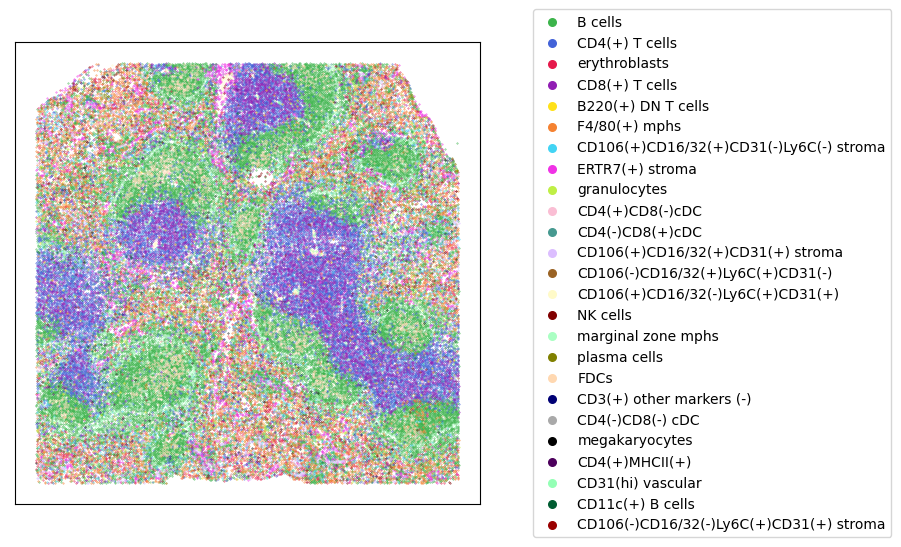

In [11]:
# Plot all cell types in one sample

sample = 'BALBc-1'
count = 0 # Number of cell types present
j = -1

fig = plt.figure(figsize=(6, 6))

for ct in cell_types:
    j += 1
    x = stitched[sample,ct][0]
    y = stitched[sample,ct][1]
    plt.scatter(x, y, label = ct, s=0.1, color=colors[j])
    if x.any():
        count=count+1

plt.xticks([])
plt.yticks([])

lgnd=plt.legend(loc='center right',markerscale=2.,bbox_to_anchor=(1.9, 0.5))

for i in range(0,count):
    lgnd.legendHandles[i]._sizes = [30]

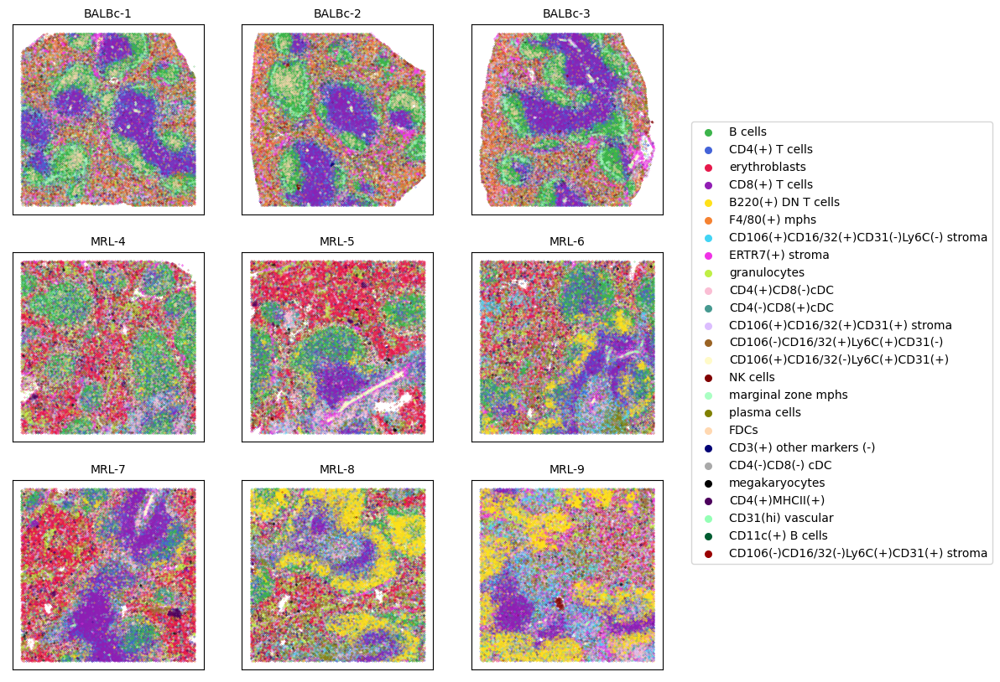

In [12]:
# Plot all cell types in every sample
fig, axs = plt.subplots(3, 3, figsize=(10, 10))

for i in range(0,9):    
    sample = samples[i]
    ax = axs[math.floor(i/3), i%3]
    ax.set_title(sample, fontsize=10)
    for j in range(0,len(cell_types)):
        ct = cell_types[j]
        x = stitched[sample,ct][0]
        y = stitched[sample,ct][1]
        ax.scatter(x, y, label = ct, s=0.05,c=colors[j])
        ax.set_xticks([], [])
        ax.set_yticks([], [])

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))       
lgnd = fig.legend(by_label.values(), by_label.keys(),loc='center right',bbox_to_anchor=(1.3, 0.5))

for i in range(0,len(cell_types)):
    lgnd.legendHandles[i]._sizes = [30]

# Large-scale structure

## Red pulp / White pulp separation

We separate the cell types into two groups: red pulp and white pulp cells; according to the article's analysis.

In [13]:
group1 = [
    #'capsule',
    'CD31(hi) vascular',
    'plasma cells',
    'CD106(-)CD16/32(-)Ly6C(+)CD31(+) stroma',
    'CD4(+)CD8(-)cDC',
    'ERTR7(+) stroma',
    'CD4(+)MHCII(+)',
    'CD4(-)CD8(-) cDC',
    'CD4(-)CD8(+)cDC',
    'CD106(+)CD16/32(-)Ly6C(+)CD31(+)',
    'megakaryocytes',
    'CD106(-)CD16/32(+)Ly6C(+)CD31(-)',
    'CD106(+)CD16/32(+)CD31(+) stroma',  # In the article it appears as CD106(+)CD16/32(+)Ly6C(-)CD31(+) stroma
    'granulocytes',
    'CD3(+) other markers (-)',
    'NK cells',
    'F4/80(+) mphs',
    'erythroblasts',
    'CD11c(+) B cells',
    'CD106(+)CD16/32(+)CD31(-)Ly6C(-) stroma',
]
group2 = [
    'FDCs',
    'marginal zone mphs',
    'B cells',
    'CD8(+) T cells',
    'CD4(+) T cells',
    # 'noid'
    'B220(+) DN T cells',
]

We start by visualising the mouse spleen architecture, and how it evolves when the disease advances.

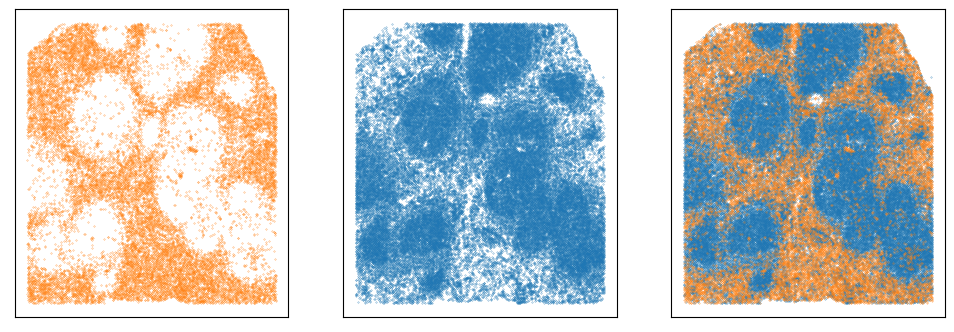

In [14]:
sample = 'BALBc-1'

fig, axs = plt.subplots(1, 3, figsize=(12, 4))

rp = axs[0]
wp = axs[1]
both = axs[2]

for ct in group2:
    x = stitched[sample,ct][0]
    y = stitched[sample,ct][1]
    wp.scatter(x, y, label = 'White pulp', s=0.05,color='#1f77b4')
    both.scatter(x, y, label = 'White pulp', s=0.05,color='#1f77b4')

for ct in group1:
    x = stitched[sample,ct][0]
    y = stitched[sample,ct][1]
    rp.scatter(x, y, label = 'Red pulp', s=0.05,color='#ff7f0e')
    both.scatter(x, y, label = 'Red pulp', s=0.05,color='#ff7f0e')

rp.set_xticks([])
rp.set_yticks([])
wp.set_xticks([])
wp.set_yticks([])
both.set_xticks([])
both.set_yticks([])

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))       
#lgnd = fig.legend(by_label.values(), by_label.keys(),loc='lower center', bbox_to_anchor=(0.5, -0.1))

for i in range(0,2):
    lgnd.legendHandles[i]._sizes = [30]

In [15]:
red_pulp = {}

for sample in samples:    
    x = np.array([])
    y = np.array([])
    for ct in group1:
        x= np.concatenate((x,stitched[sample,ct][0]),axis=None)
        y= np.concatenate((y,stitched[sample,ct][1]),axis=None)     
    red_pulp[sample] = [x,y]

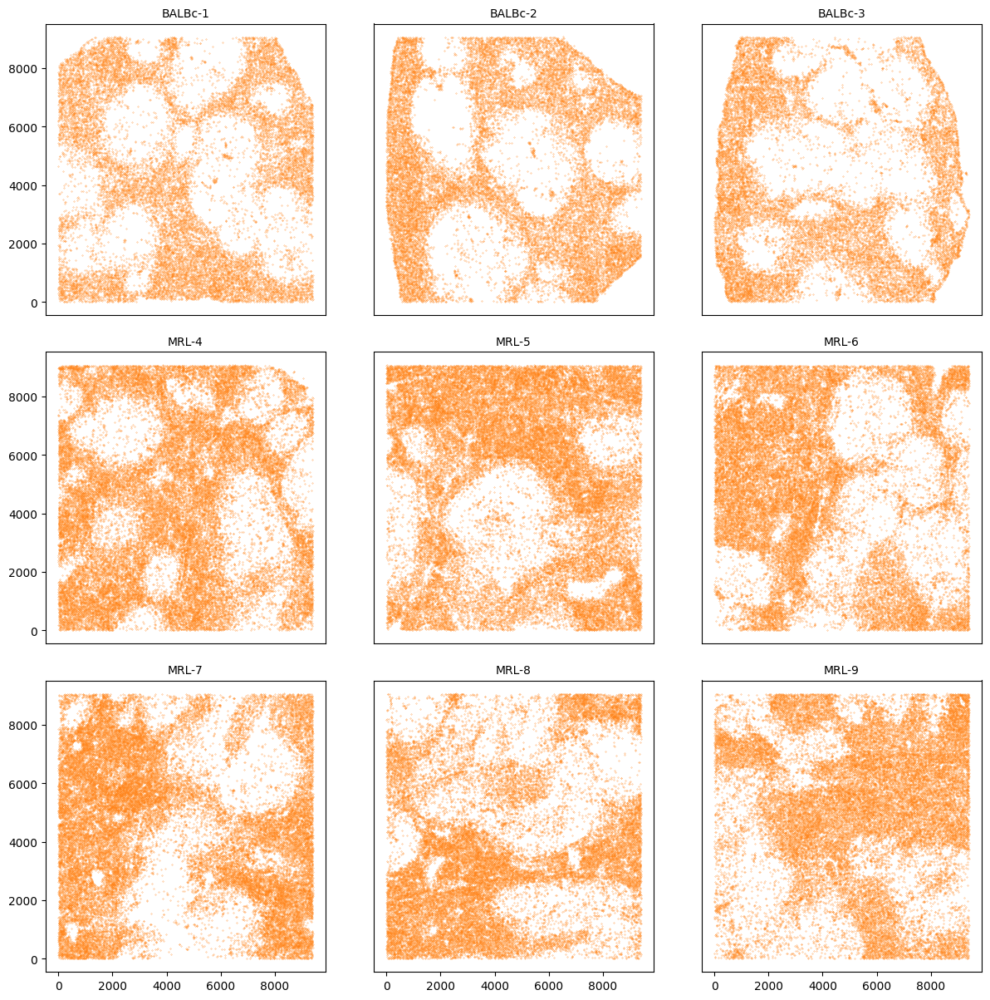

In [16]:
fig, axs = plt.subplots(3, 3, figsize=(12, 12))
fig.tight_layout()

for i in range(0,9):    
    sample = samples[i]
    x = red_pulp[sample][0]
    y = red_pulp[sample][1]
    
    ax = axs[math.floor(i/3), i%3]
    ax.scatter(x, y, label = sample, s=0.05,color='#ff7f0e')
    ax.set_title(sample, fontsize=10)
    if i%3!= 0:
        ax.set_yticks([], [])
    if i<=5:
        ax.set_xticks([], [])

The samples are readily distinguishables by looking at the density of red pulp cells.

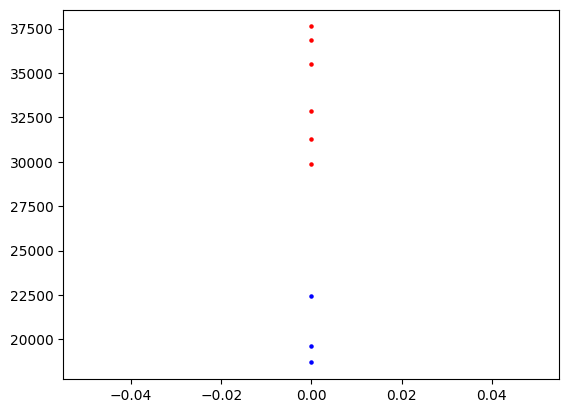

In [17]:
red_pulp_densities = [len(red_pulp[sample][0]) for sample in samples]
plt.scatter(np.zeros(len(red_pulp_densities[:3])), red_pulp_densities[:3], s=5,color='blue')
plt.scatter(np.zeros(len(red_pulp_densities[3:])), red_pulp_densities[3:], s=5,color='red')

## Alpha complexes persistent homology

The ripser implementation is not feasible for the size of the sample and the computer used. We reduce the size of the simplicial complex by using alpha complexes.

In [18]:
# Computation of alpha complexes persistent homology

min_pers = 5000 # We choose a minimum persistence to reduce the noise and make later computations faster.
degree = 1

alpha_dgms = []

for sample in samples:
    data = np.vstack((red_pulp[sample][0], red_pulp[sample][1])).T
    stree = gudhi.AlphaComplex(points = data).create_simplex_tree()
    alpha_dgms.append(stree.persistence(min_persistence=min_pers))

In [19]:
# Rearrange diagram information

deg_max = 1

alpha_dgms_plot = [[[] for _ in range(deg_max+1)] for _ in range(len(alpha_dgms))] #empty sets
for i in range(len(alpha_dgms)):
    for point in alpha_dgms[i]:
        alpha_dgms_plot[i][point[0]].append([point[1][0],point[1][1]])
    for j in range(deg_max+1):
        alpha_dgms_plot[i][j] = np.array(alpha_dgms_plot[i][j])

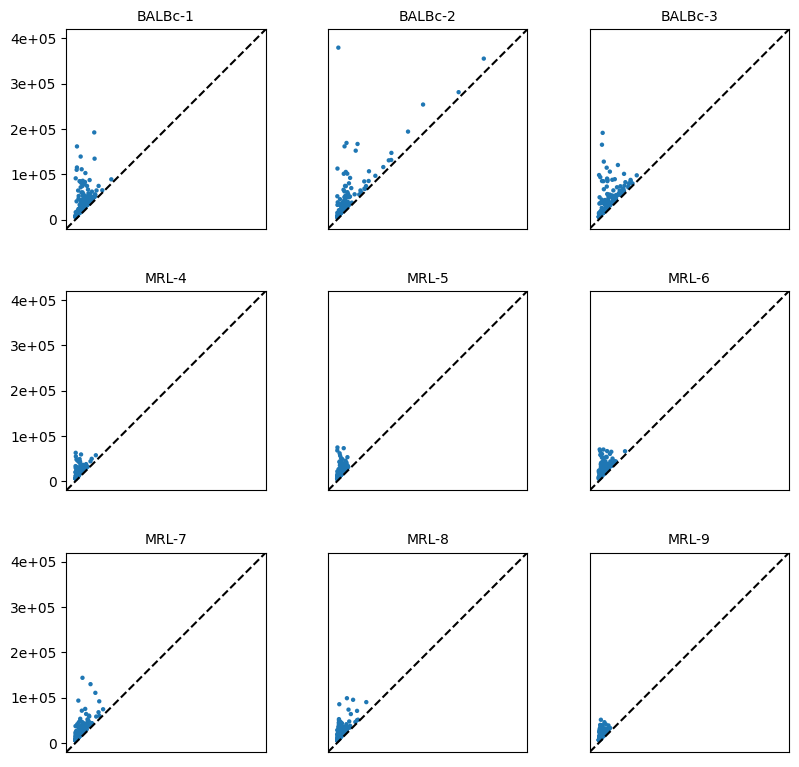

In [20]:
# Plot persistence diagrams of degree 1 homology

fig, axs = plt.subplots(3, 3, figsize=(8, 8))
#fig.suptitle('Red pulp. Alpha complex PH \n', fontsize=14)
fig.tight_layout()

for i in range(0,9):
    sample = samples[i]
    ax = axs[math.floor(i/3), i%3]
    plot_diagrams(alpha_dgms_plot[i], xy_range =[-20000,420000,-20000,420000], #lifetime='True',
                  plot_only = [1], size = 10, ax=ax,legend='False')
    ax.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.2g'))
    ax.set_xticks([], [])
    if i%3 != 0:
        ax.set_yticks([], [])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(sample, fontsize=10)

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))       
#lgnd = fig.legend(by_label.values(), by_label.keys(),loc='center right',bbox_to_anchor=(1.1, 0.5))

In [21]:
# Select the degree 1 points
alpha_dgms_1 = [lst[1] for lst in alpha_dgms_plot]

### Bottleneck distances

The bottleneck distances also take some time to compute, the key function is commented. The object is saved and can be loaded instead.

We can perceive a change between the 3 first samples (healthy) and the rest. Note that the diagram for BALBc-2 contains a very high persistence feature, which most probably corresponds to the very clean hole at the upper left of the image.

To proceed with the comparisson, we first compute the pairwise bottleneck distances.

In [20]:
# Bottleneck distances matrix
# We need to set a min persistence for it to be computationally feasible.
bot_dist_alpha = np.zeros((9,9))
st = time.time()
for i in range(0,9):
    for j in range (0,9):
        if j>=i:
            #bot_dist_alpha[i,j] = round(bottleneck(alpha_dgms_1[i], alpha_dgms_1[j]),0)
        else:
            bot_dist_alpha[i,j] = bot_dist_alpha[j,i]
print(bot_dist_alpha)
et = time.time()
print('\n Execution time:', round((et - st)/60), 'minutes')

[[     0. 186916.  32891.  78970.  78970.  78970.  48601.  75340.  78970.]
 [186916.      0. 187870. 188175. 188175. 188175. 188175. 188175. 188175.]
 [ 32891. 187870.      0.  91309.  91309.  91309.  47648.  91309.  91309.]
 [ 78970. 188175.  91309.      0.  13817.  17353.  64021.  35867.  14504.]
 [ 78970. 188175.  91309.  13817.      0.  13266.  64021.  24086.  27278.]
 [ 78970. 188175.  91309.  17353.  13266.      0.  64021.  28448.  25285.]
 [ 48601. 188175.  47648.  64021.  64021.  64021.      0.  44988.  64021.]
 [ 75340. 188175.  91309.  35867.  24086.  28448.  44988.      0.  38468.]
 [ 78970. 188175.  91309.  14504.  27278.  25285.  64021.  38468.      0.]]

 Execution time: 2 minutes


In [22]:
# LOAD PYTHON OBJECT bot_dist_alpha WITH PICKLE
with open('bot_alpha_file', 'rb') as bot_alpha_file:
    bot_dist_alpha = pickle.load(bot_alpha_file)

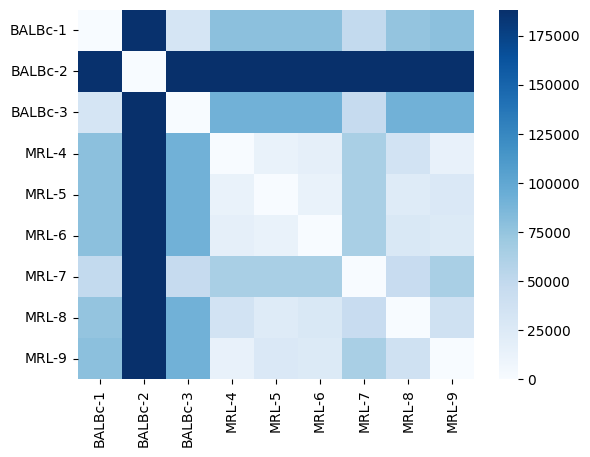

In [23]:
labels = samples
df_bottleneck = pd.DataFrame(bot_dist_alpha, index = labels,
                  columns = labels)

h = sns.heatmap(df_bottleneck,cmap='Blues')
fig = h.get_figure()

We try to make a classification of the points based on this distance matrix. Note that for d=40000 both samples 2 and 7 are considered outliers, for d=45000, 7 is included in the diseased group and so the classfication is correct with the exception of 2, and for d=50000 the classification is lost.

In [24]:
for d in list(range(10000,55000,5000))+list(range(170000,195000,5000)):
    labels = DBSCAN(eps=d, min_samples=2,metric='precomputed').fit(bot_dist_alpha).labels_
    print('d=',d,':',labels)

d= 10000 : [-1 -1 -1 -1 -1 -1 -1 -1 -1]
d= 15000 : [-1 -1 -1  0  0  0 -1 -1  0]
d= 20000 : [-1 -1 -1  0  0  0 -1 -1  0]
d= 25000 : [-1 -1 -1  0  0  0 -1  0  0]
d= 30000 : [-1 -1 -1  0  0  0 -1  0  0]
d= 35000 : [ 0 -1  0  1  1  1 -1  1  1]
d= 40000 : [ 0 -1  0  1  1  1 -1  1  1]
d= 45000 : [ 0 -1  0  1  1  1  1  1  1]
d= 50000 : [ 0 -1  0  0  0  0  0  0  0]
d= 170000 : [ 0 -1  0  0  0  0  0  0  0]
d= 175000 : [ 0 -1  0  0  0  0  0  0  0]
d= 180000 : [ 0 -1  0  0  0  0  0  0  0]
d= 185000 : [ 0 -1  0  0  0  0  0  0  0]
d= 190000 : [0 0 0 0 0 0 0 0 0]


In [25]:
print(DBSCAN(eps=45000, min_samples=2,metric='precomputed').fit(bot_dist_alpha).labels_)

[ 0 -1  0  1  1  1  1  1  1]


Note that the high-persistence point in BALBc-2's diagram makes it very distant from the rest of diagrams. To see the proximity between the other diagrams more precisely, we remove this point and compute the distances again.

### Persistence images

In [26]:
# Try computing Persistence Images of degree 1 homology

pxl = 20000
pimgr = PersistenceImager(pixel_size=pxl)
pimgr.fit(alpha_dgms_1)

# Choose a linear weight function to give more importance to higher persistence features
pimgr.weight = linear_ramp
pimgr.weight_params = {'low':0.0, 'high':1000.0, 'start':5000, 'end':400000}

# Choose a higher variance of the gaussian functions centered at each point
pimgr.kernel_params = {'sigma': 100000000}

imgs_alpha = pimgr.transform(alpha_dgms_1, skew=True)

In [27]:
print('PERSISTENCE IMAGE PARAMETERS:')
print('Resolution (pixel size):', pimgr.pixel_size)
print('Variance:',pimgr.kernel_params)
print('Weight (linear ramp) parameters:',pimgr.weight_params)

PERSISTENCE IMAGE PARAMETERS:
Resolution (pixel size): 20000
Variance: {'sigma': 100000000}
Weight (linear ramp) parameters: {'low': 0.0, 'high': 1000.0, 'start': 5000, 'end': 400000}


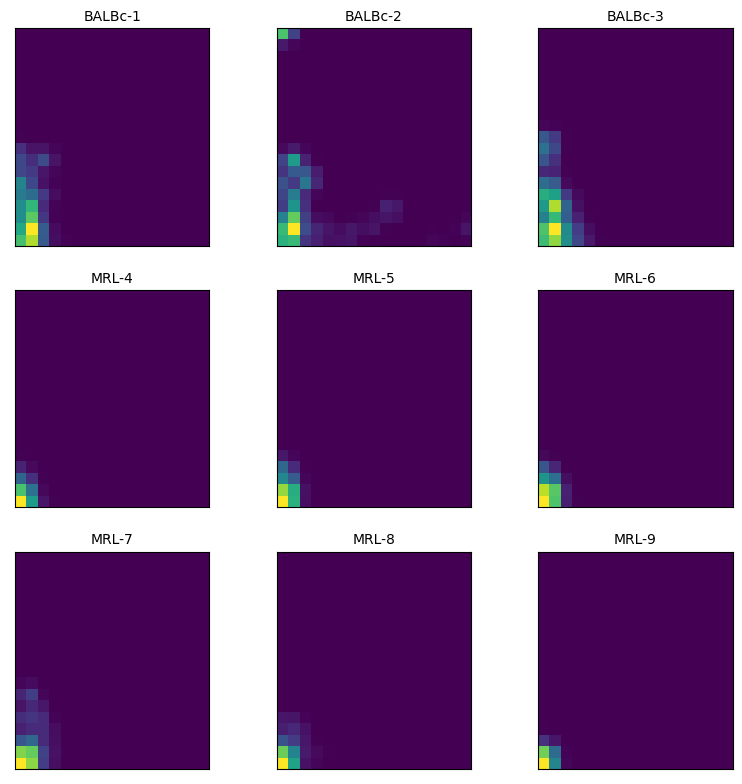

In [28]:
# Plot Persistence Images

fig, axs = plt.subplots(3, 3, figsize=(8,8))
fig.tight_layout()

for i in range(0,9):    
    ax = axs[math.floor(i/3), i%3]
    pimgr.plot_image(imgs_alpha[i], ax)
    ax.set_title(samples[i], fontsize=10)
    #ax.set_xticks([], [])
    #ax.set_yticks([], [])
    ax.set_xlabel('')
    ax.set_ylabel('')

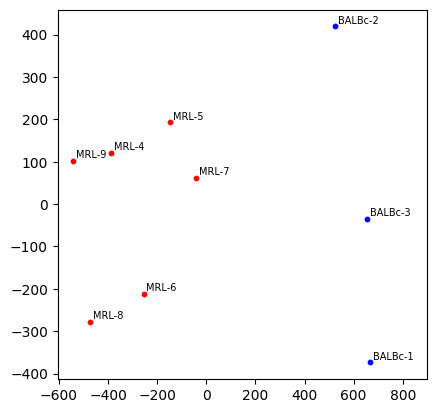

In [30]:
# Separate images

sep = 3

imgs_BALBc_alpha = []
imgs_MRL_alpha = []
for i in range(0,9):
    if i <=2:
        imgs_BALBc_alpha.append(imgs_alpha[i])
    else:
        imgs_MRL_alpha.append(imgs_alpha[i])

# Dimensionality reduction

images_array = np.array([image.flatten() for image in imgs_alpha])
pca = PCA(n_components=2)
images_array_pca_alpha = (pca.fit_transform(images_array)).T


fig, ax = plt.subplots()

#create simple line plot
ax.scatter(images_array_pca_alpha[0][:sep], images_array_pca_alpha[1][:sep], s = 10, color='blue',label='Healthy')
ax.scatter(images_array_pca_alpha[0][sep:], images_array_pca_alpha[1][sep:], s = 10, color='red',label='Diseased')
ax.set_xlim(-605,900)

#set aspect ratio to 1
ratio = 1.0
x_left, x_right = ax.get_xlim()
y_low, y_high = ax.get_ylim()
ax.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
#ax.legend()

for i, txt in enumerate(range(0,9)):
    ax.annotate(samples[txt], xy = (images_array_pca_alpha[0][i], images_array_pca_alpha[1][i]),
                xycoords='data', xytext=(2, 2), textcoords='offset points',size=7)


plt.show()

Finally we use the K-means clustering algorithm to try to separate the two sets of points, and it does a correct classification.

In [32]:
# K-means clustering

km_alpha = KMeans(n_clusters = 2).fit(images_array_pca_alpha.T)
print('K-means labels:', km_alpha.labels_)

K-means labels: [1 1 1 0 0 0 0 0 0]


## Witness complexes Persistent homology

The idea is to get "cleaner diagrams", avoiding the noise that there is inside the holes. The landmark points used can be loaded, the code for choosing new points is commented.

In [33]:
# Choose landmark points

landmark_ratio = 20 # density parameter

landmarks = {}

for sample in samples:
    x = red_pulp[sample][0]
    y = red_pulp[sample][1]
    data = np.vstack((x,y)).T

    num_landmarks = math.ceil(len(data)/landmark_ratio) # Recommended in de Silva and Carlsson paper
    idx = np.random.randint(len(data), size=num_landmarks)
    
    #landmarks[sample] = data[idx,:].T

In [34]:
# LOAD PYTHON OBJECT landmarks WITH PICKLE
with open('landmarks_file', 'rb') as landmarks_file:
    landmarks = pickle.load(landmarks_file)

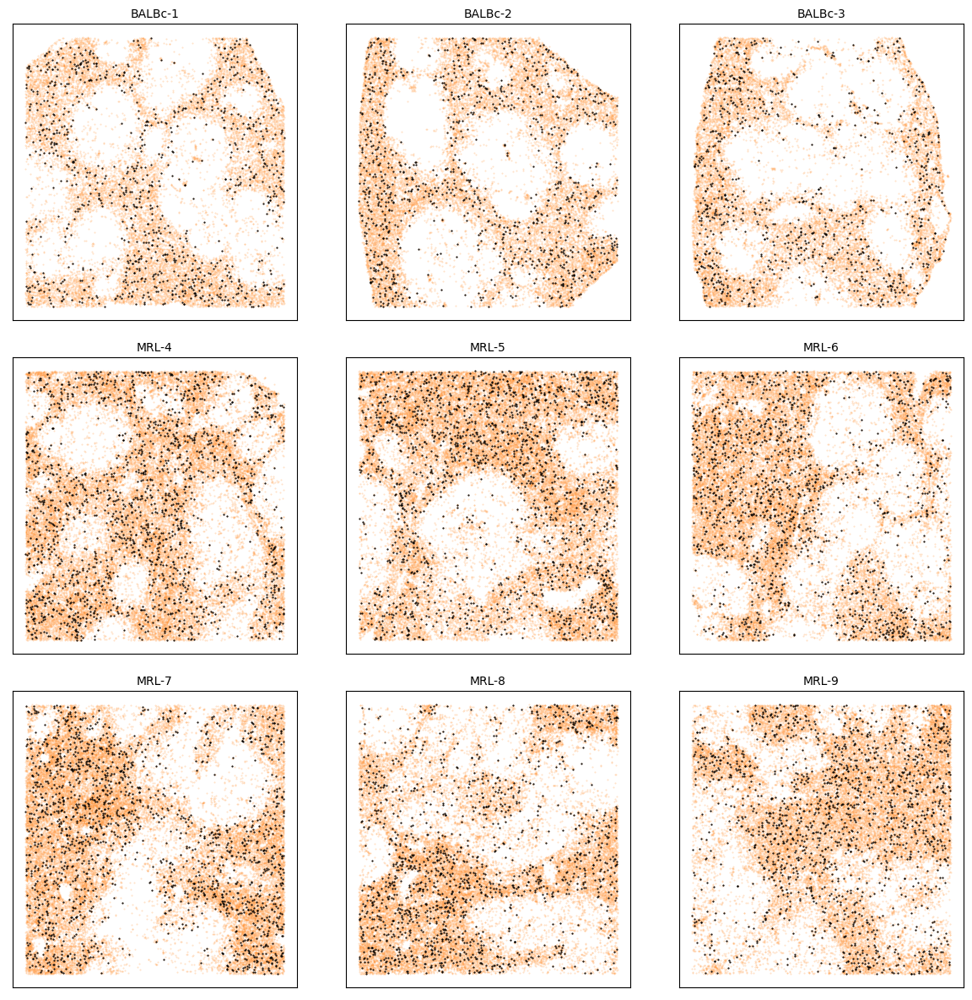

In [35]:
# Plot the landmark points
fig, axs = plt.subplots(3, 3, figsize=(12, 12))
#fig.suptitle('Landmark points in the red pulp \n', fontsize=14)
fig.tight_layout()

for i in range(0,9):    
    sample = samples[i]
    x = red_pulp[sample][0]
    y = red_pulp[sample][1]
    x_l = landmarks[sample][0]
    y_l = landmarks[sample][1]
    
    ax = axs[math.floor(i/3), i%3]
    ax.scatter(x, y, label = sample, s=0.2,color='#ff7f0e',alpha=0.25)
    ax.scatter(x_l, y_l, label = sample, s=0.3,color='black')
    
    ax.set_title(sample, fontsize=10)
    ax.set_xticks([], [])
    ax.set_yticks([], [])

In [36]:
witness_dgms = [[] for _ in range(0,9)]
max_alpha2 = [700000, 3000000, 700000, 200000, 400000, 200000, 300000, 200000, 300000]

As we can see in the following cell, the witness complex takes a significant amount of time to compute, the key function is commented. The object is saved and can be loaded instead.

In [11]:
for i in range(0,9):
    sample = samples[i]
    
    st = time.time()
    
    x = red_pulp[sample][0]
    y = red_pulp[sample][1]
    data = np.vstack((x,y)).T
    
    witness_complex = gudhi.EuclideanWitnessComplex(witnesses=data, landmarks=landmarks[sample].T)
    simplex_tree = witness_complex.create_simplex_tree(max_alpha_square=max_alpha2[i], limit_dimension=2)
    #witness_dgms[i] = simplex_tree.persistence()
    
    et = time.time()
    print(sample + ':', round((et - st)/60), 'minutes')

BALBc-1: 3 minutes
BALBc-2: 168 minutes
BALBc-3: 4 minutes
MRL-4: 1 minutes
MRL-5: 7 minutes
MRL-6: 1 minutes
MRL-7: 4 minutes
MRL-8: 1 minutes
MRL-9: 2 minutes


In [37]:
# LOAD PYTHON OBJECT witness_dgms WITH PICKLE
with open('witness_file', 'rb') as witness_file:
    witness_dgms = pickle.load(witness_file)

In [38]:
# Rearrange diagram information

deg_max = 1

witness_dgms_plot = [[[] for _ in range(deg_max+1)] for _ in range(len(witness_dgms))] #empty sets
for i in range(len(witness_dgms)):
    for point in witness_dgms[i]:
        witness_dgms_plot[i][point[0]].append([point[1][0],point[1][1]])
    for j in range(deg_max+1):
        witness_dgms_plot[i][j] = np.array(witness_dgms_plot[i][j])

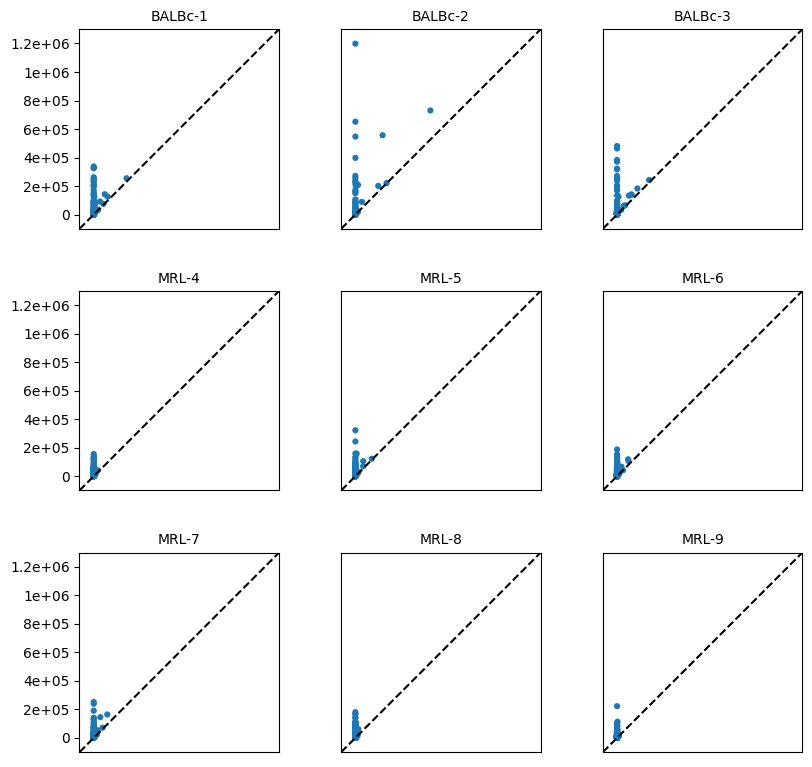

In [39]:
# Plot persistence diagrams of degree 1 homology

fig, axs = plt.subplots(3, 3, figsize=(8, 8))
#fig.suptitle('Red pulp. Witness complex PH \n', fontsize=14)
fig.tight_layout()

for i in range(0,9):
    sample = samples[i]
    ax = axs[math.floor(i/3), i%3]
    plot_diagrams(witness_dgms_plot[i], xy_range =[-100000,1300000,-100000,1300000], #lifetime='True', 
                  plot_only = [1], size = 20, ax=ax,legend='False')
    ax.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.2g'))
    ax.set_xticks([], [])
    if i%3 != 0:
        ax.set_yticks([], [])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(sample, fontsize=10)

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))       
#lgnd = fig.legend(by_label.values(), by_label.keys(),loc='center right',bbox_to_anchor=(1.1, 0.5))

In [40]:
# Select the degree 1 points
witness_dgms_1 = [lst[1] for lst in witness_dgms_plot]

Again, the bottlenecek distance matrix takes 24 minutes to compute, the key function is commented. The object is saved and can be loaded instead.

In [196]:
# Bottleneck distances matrix
bot_dist_witness = np.zeros((9,9))
st = time.time()
for i in range(0,9):
    for j in range (0,9):
        if j>=i:
            #bot_dist_witness[i,j] = round(bottleneck(witness_dgms_1[i], witness_dgms_1[j]),0)
        else:
            bot_dist_witness[i,j] = bot_dist_witness[j,i]
print(bot_dist_witness)
et = time.time()
print('\n Execution time:', round((et - st)/60), 'minutes')

[[     0. 599288. 143322. 168604. 162632. 164042. 134566. 160650. 164042.]
 [599288.      0. 599288. 599288. 599288. 599288. 599288. 599288. 599288.]
 [143322. 599288.      0. 240265. 219591. 240265. 229202. 240265. 240265.]
 [168604. 599288. 240265.      0. 161092.  32486.  96298.  36283.  67149.]
 [162632. 599288. 219591. 161092.      0. 134260.  70857. 141756. 121924.]
 [164042. 599288. 240265.  32486. 134260.      0.  85417.  20596.  45477.]
 [134566. 599288. 229202.  96298.  70857.  85417.      0.  70899. 119702.]
 [160650. 599288. 240265.  36283. 141756.  20596.  70899.      0.  60643.]
 [164042. 599288. 240265.  67149. 121924.  45477. 119702.  60643.      0.]]

 Execution time: 24 minutes


In [41]:
# LOAD PYTHON OBJECT bot_dist_witness WITH PICKLE
with open('bot_dist_witness_file', 'rb') as bot_dist_witness_file:
    bot_dist_witness = pickle.load(bot_dist_witness_file)

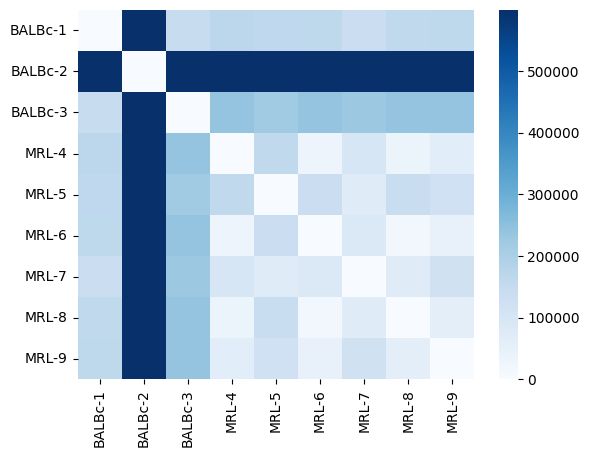

In [42]:
labels = samples
df_bottleneck = pd.DataFrame(bot_dist_witness, index = labels,
                  columns = labels)

h = sns.heatmap(df_bottleneck,cmap='Blues')
fig = h.get_figure()

In [43]:
for d in list(range(50000,500000,50000)): #+list(range(170000,195000,5000)):
    labels = DBSCAN(eps=d, min_samples=2,metric='precomputed').fit(bot_dist_witness).labels_
    print('d=',d,':',labels)

d= 50000 : [-1 -1 -1  0 -1  0 -1  0  0]
d= 100000 : [-1 -1 -1  0  0  0  0  0  0]
d= 150000 : [ 0 -1  0  0  0  0  0  0  0]
d= 200000 : [ 0 -1  0  0  0  0  0  0  0]
d= 250000 : [ 0 -1  0  0  0  0  0  0  0]
d= 300000 : [ 0 -1  0  0  0  0  0  0  0]
d= 350000 : [ 0 -1  0  0  0  0  0  0  0]
d= 400000 : [ 0 -1  0  0  0  0  0  0  0]
d= 450000 : [ 0 -1  0  0  0  0  0  0  0]


In [44]:
print(DBSCAN(eps=100000, min_samples=2,metric='precomputed').fit(bot_dist_witness).labels_)

[-1 -1 -1  0  0  0  0  0  0]


In [45]:
# Try computing Persistence Images of degree 1 homology

pxl = 50000
pimgr = PersistenceImager(pixel_size=pxl)
pimgr.fit(witness_dgms_1)

# Choose a linear weight function to give more importance to higher persistence features
pimgr.weight = linear_ramp
pimgr.weight_params = {'low':0.0, 'high':1000.0, 'start':5000, 'end':1300000}

# Choose a higher variance of the gaussian functions centered at each point
pimgr.kernel_params = {'sigma': 100000000}

imgs_witness = pimgr.transform(witness_dgms_1, skew=True)

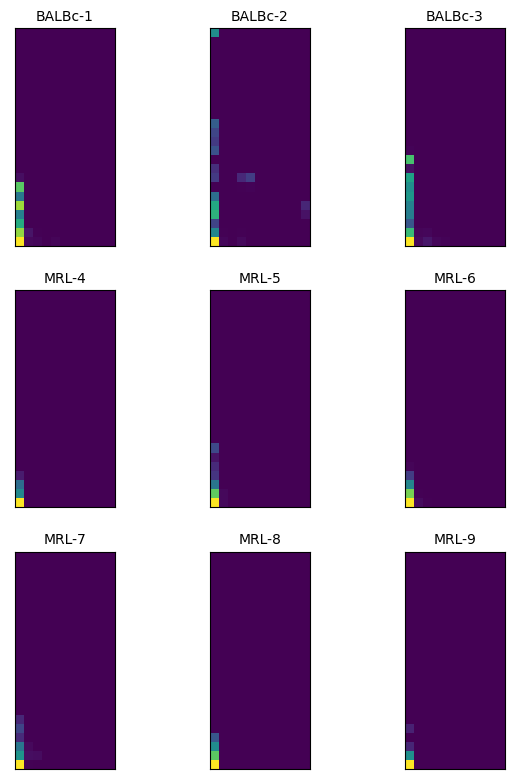

In [47]:
# Plot Persistence Images

fig, axs = plt.subplots(3, 3, figsize=(6,8))
fig.tight_layout()

for i in range(0,9):    
    ax = axs[math.floor(i/3), i%3]
    pimgr.plot_image(imgs_witness[i], ax)
    ax.set_title(samples[i], fontsize=10)
    #ax.set_xticks([], [])
    #ax.set_yticks([], [])
    ax.set_xlabel('')
    ax.set_ylabel('')

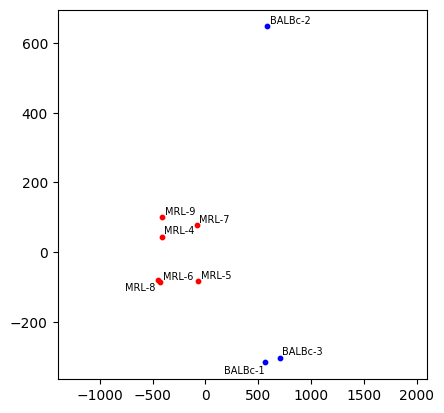

In [48]:
# Separate images

sep = 3

imgs_BALBc_witness = []
imgs_MRL_witness = []
for i in range(0,9):
    if i <=2:
        imgs_BALBc_witness.append(imgs_witness[i])
    else:
        imgs_MRL_witness.append(imgs_witness[i])

# Dimensionality reduction

images_array = np.array([image.flatten() for image in imgs_witness])
pca = PCA(n_components=2)
images_array_pca_witness = (pca.fit_transform(images_array)).T


fig, ax = plt.subplots()

#create simple line plot
ax.scatter(images_array_pca_witness[0][:sep], images_array_pca_witness[1][:sep], s = 10, color='blue',label='Healthy')
ax.scatter(images_array_pca_witness[0][sep:], images_array_pca_witness[1][sep:], s = 10, color='red',label='Diseased')
ax.set_xlim(-1400,2100)

#set aspect ratio to 1
ratio = 1.0
x_left, x_right = ax.get_xlim()
y_low, y_high = ax.get_ylim()
ax.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
#ax.legend()

for i in list(range(1,7))+[8]:
    ax.annotate(samples[i], xy = (images_array_pca_witness[0][i], images_array_pca_witness[1][i]),
                xycoords='data', xytext=(2, 2), textcoords='offset points',size=7)

ax.annotate(samples[7], xy = (images_array_pca_witness[0][7], images_array_pca_witness[1][7]),
                xycoords='data', xytext=(-24, -8), textcoords='offset points',size=7)
ax.annotate(samples[0], xy = (images_array_pca_witness[0][0], images_array_pca_witness[1][0]),
                xycoords='data', xytext=(-30, -8), textcoords='offset points',size=7)

plt.show()

In [50]:
# K-means clustering

km_witness = KMeans(n_clusters = 2).fit(images_array_pca_witness.T)
print('K-means labels:', km_witness.labels_)

K-means labels: [0 0 0 1 1 1 1 1 1]


# Small-scale structure

## Sampling densest zones

I choose the cell types that have denser zones in all samples, to look for small scale structure. We will build a new data frame with smaller tiles (4 tiles out of each original tile), and choose from them the 10 densest for each sample and cell type.

In [51]:
dense_ct = cell_types[0:4]
dense_ct

['B cells', 'CD4(+) T cells', 'erythroblasts', 'CD8(+) T cells']

In [52]:
# Rebuild reduced dataframe

DF = {'ct': None, 'sample': None, 'tile': None, 'X': None, 'Y': None}

df_dense = pd.DataFrame()

n = 2

d_x = 1344/n;
d_y = 1008/n;

for ct in dense_ct:
    IDs = df_mmc[df_mmc["Imaging phenotype (cell type)"]==ct]["X-shift cluster ID"].values
    
    # extract relevant rows
    cells = df_cells[(df_cells["Imaging phenotype cluster ID"].isin(IDs))]
    size = len(cells)
    
    # extract relevant columns
    samples_list = cells['sample_Xtile_Ytile'].str.split("_").str[0].values
    x_bigtile = cells['sample_Xtile_Ytile'].str.split("_").str[1].str[2].astype(int).values - [1]*len(cells)
    y_bigtile = cells['sample_Xtile_Ytile'].str.split("_").str[2].str[2].astype(int).values - [1]*len(cells)
    x = cells["X.X"].values
    y = cells["Y.Y"].values
    x_subtile = [math.floor(i/d_x) for i in x]
    y_subtile = [math.floor(i/d_y) for i in y]
    x_tile = x_bigtile*n + x_subtile
    y_tile = y_bigtile*n + y_subtile

    # build new dataframe
    DF['ct'] = ct
    DF['sample'] = samples_list
    DF['tile'] = [str(x_tile[i])+'-'+str(y_tile[i]) for i in range(0,size)]
    DF['X'] = [x[i] - d_x*x_subtile[i] for i in range(0,size)]
    DF['Y'] = [y[i] - d_y*y_subtile[i] for i in range(0,size)]
    
    data = pd.DataFrame.from_dict(DF)
    df_dense = pd.concat([df_dense,data]) 

In [53]:
# Find the highest density patches for each sample and ct.

N = 10

dense_tiles = {}

for ct in dense_ct:
    for sample in samples:
        cells = df_dense[(df_dense['ct']==ct) & (df_dense['sample']==sample)]
        dense_tiles[ct,sample] = cells.tile.value_counts()[:N].index.tolist()

## Analysis

In [54]:
# Compute the persistence diagrams with ripser

sscale_dgms = {}
sscale_densities = [[[],[]] for _ in range(len(dense_ct))]

et = time.time()
for i in range(len(dense_ct)):
    ct = dense_ct[i]
    for j in range(len(samples)):
        sample=samples[j]
        sscale_dgms[ct,sample] = []
        for tile in dense_tiles[ct,sample]:
            #tile = dense_tiles[ct,sample]
            patch = df_dense[(df_dense['ct']==ct) & (df_dense['sample']==sample) & (df_dense['tile'] == tile)]
            x = patch["X"].values
            y = patch["Y"].values
        
            data = np.vstack((x, y)).T
            sscale_dgms[ct,sample].append(ripser(data,maxdim=1)['dgms'])
            
            if j<=2:
                sscale_densities[i][0].append(len(x))
            else:
                sscale_densities[i][1].append(len(x))
st = time.time()
print('Execution time:', round((st-et)/60), 'minutes')

Execution time: -1 minutes


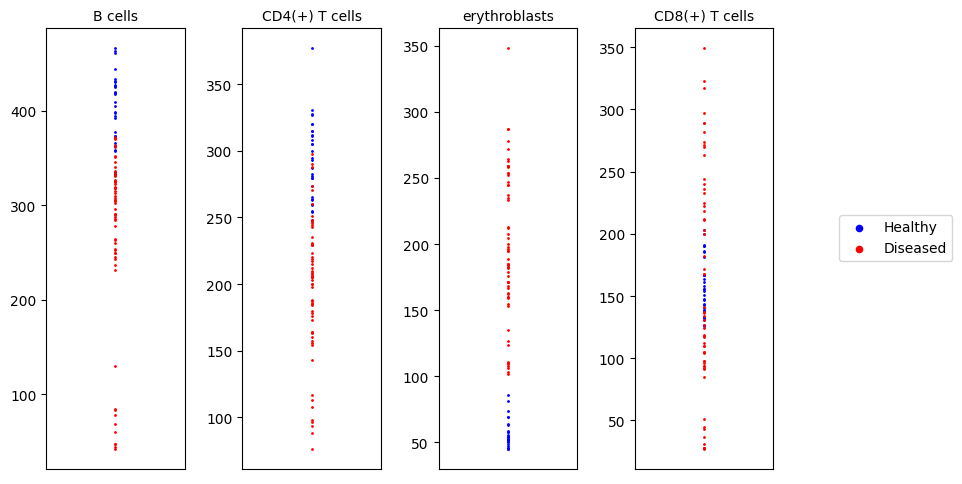

In [55]:
# Plot densities

fig, axs = plt.subplots(1, 4, figsize=(8, 5))
fig.tight_layout()

for i in range(len(dense_ct)):
    ct = dense_ct[i]
    ax = axs[i]
    ax.scatter(np.zeros(len(sscale_densities[i][0])), sscale_densities[i][0], s=1,color='blue',label='Healthy')
    ax.scatter(np.zeros(len(sscale_densities[i][1])), sscale_densities[i][1], s=1,color='red',label='Diseased')
    ax.set_xticks([], [])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(ct, fontsize=10)

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))       
lgnd = fig.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.2,0.6))

for i in range(0,2):
    lgnd.legendHandles[i]._sizes = [20]

In [56]:
# Compute persistence images of degree 1 homology

pxl = 10

sscale_imgs = {}

from persim.images_weights import linear_ramp

for ct in dense_ct:
    # Fit pimgr with the 10*9 diagrams
    sscale_dgms_1 = []
    for sample in samples:
        sscale_dgms_1 = sscale_dgms_1 + [x[1] for x in sscale_dgms[ct,sample]]
    
    pimgr = PersistenceImager(pixel_size=pxl)
    pimgr.weight = linear_ramp
    pimgr.weight_params = {'low':0.0, 'high':10.0, 'start':0, 'end':100}
    pimgr.kernel_params = {'sigma': 10}

    pimgr.fit(sscale_dgms_1)
    
    for sample in samples:
        sscale_imgs[ct,sample] = pimgr.transform([x[1] for x in sscale_dgms[ct,sample]])

In [57]:
# Separate images
imgs_BALBc_sscale = {}
imgs_MRL_sscale = {}

sep = N*3

for ct in dense_ct:
    imgs_BALBc_sscale[ct] = []
    imgs_MRL_sscale[ct] = []
    for sample in samples:
        if sample.startswith('BALB'):
            imgs_BALBc_sscale[ct] = imgs_BALBc_sscale[ct]+ sscale_imgs[ct,sample]
        else:
            imgs_MRL_sscale[ct] = imgs_MRL_sscale[ct]+ sscale_imgs[ct,sample]

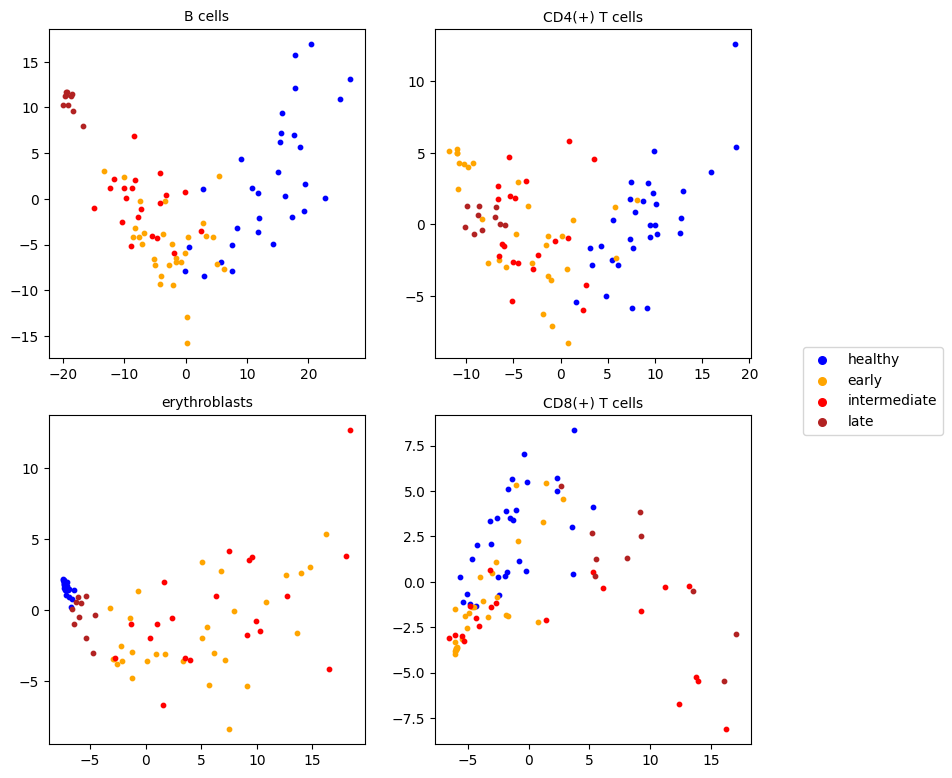

In [58]:
# Dimensionality reduction

images_array_pca_sscale = {}

for ct in dense_ct:
    images_array = np.array([image.flatten() for image in imgs_BALBc_sscale[ct]+imgs_MRL_sscale[ct]])
    pca = PCA(n_components=2)
    images_array_pca_sscale[ct] = (pca.fit_transform(images_array)).T

stages_colors = ['blue','orange','red','firebrick']
stages = ['healthy','early','intermediate','late']
stages_sep = [0,30,60,80,90]


fig, axs = plt.subplots(2, 2, figsize=(8, 8))
fig.tight_layout(pad=2)

for i in range(4):
    ct = dense_ct[i]
    ax = axs[math.floor(i/2), i%2]
    ax.set_title(ct, fontsize=10)
    
    #ax.scatter(images_array_pca_sscale[ct][0][:sep], images_array_pca_sscale[ct][1][:sep], s = 10, color='blue',label=stages[0])
    #plt.scatter(images_array_pca[ct][0][sep:], images_array_pca[ct][1][sep:], s = 10, color='red')
    #Code for plotting stages of disease of different colors.
    for k in range(0,4):
        ax.scatter(images_array_pca_sscale[ct][0][stages_sep[k]:stages_sep[k+1]],
                    images_array_pca_sscale[ct][1][stages_sep[k]:stages_sep[k+1]], s = 10,
                    color=stages_colors[k],label=stages[k])
    #plt.title(ct)
    #plt.legend()
    #plt.show()
    
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))       
lgnd = fig.legend(by_label.values(), by_label.keys(),bbox_to_anchor=(1.2, 0.57))

for i in range(0,len(stages)):
    lgnd.legendHandles[i]._sizes = [30]

## Clustering

In [59]:
# Algorithm for deciding how many labels are misplaced, despite of labels being swapped.

def error(t,c):
    d = np.tile(c, (2, 1))
    where_0 = np.where(d[0] == 0)
    where_1 = np.where(d[0] == 1)
    d[1][where_0] = 1
    d[1][where_1] = 0
    
    return min([sum(np.abs(t-d[i])) for i in range(2)])/len(t)

In [60]:
true_labels = np.array([0]*30 + [1]*60)

print('Classification error with K-means (non-deterministic!):')
for ct in dense_ct:
    km = KMeans(n_clusters=2).fit(images_array_pca_sscale[ct].T)
    ac = agclust(n_clusters = 2).fit(images_array_pca_sscale[ct].T)
    print(ct, ':', round(error(true_labels,np.array(km.labels_)),2))

Classification error with K-means (non-deterministic!):
B cells : 0.07
CD4(+) T cells : 0.07
erythroblasts : 0.32
CD8(+) T cells : 0.48


## Visualise tiles, persistence diagrams and persistence images for a cell type

Since there are $4 \cdot 10 \cdot 9 = 360$ tiles, persistence diagrams and images to visualise, here we make the plots for a single cell type.

In [61]:
ct = dense_ct[1]

[305, 320, 377, 160, 260, 298, 290, 247, 198]


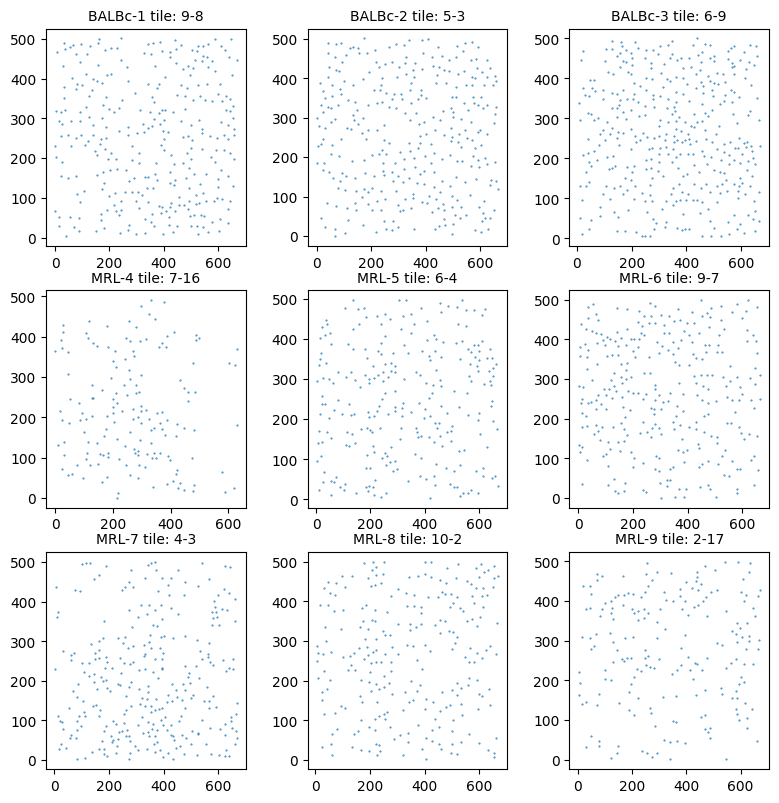

In [62]:
# Plot j-th densest tile

j = 0

fig, axs = plt.subplots(3, 3, figsize=(8, 8))
#fig.suptitle(ct, fontsize=20)
fig.tight_layout()

densest_tiles_densities = []

for i in range(0,9):
    sample = samples[i]
    tile = dense_tiles[ct,sample][j]

    ax = axs[math.floor(i/3)%3, i%3]
    ax.set_title(sample + ' tile: ' + tile, fontsize=10)
    
    patch = df_dense[(df_dense['ct']==ct) & (df_dense['sample']==sample) & (df_dense['tile'] == tile)]
    x = patch["X"].values
    y = patch["Y"].values
    
    densest_tiles_densities.append(len(x))

    ax.scatter(x, y, label = ct, s=0.2)

print(densest_tiles_densities)

In [ ]:
# Plot all tiles

for i in range(0,9):
    sample = samples[i]
    tiles = dense_tiles[ct,sample]

    fig, axs = plt.subplots(2, 5, figsize=(10, 4))
    #fig.suptitle(ct, fontsize=20)
    fig.tight_layout()

    for j in range(0,10):
        tile = tiles[j]
        ax = axs[j%2, j%5]
        ax.set_title(sample + ' tile: ' + tile, fontsize=10)
        patch = df_dense[(df_dense['ct']==ct) & (df_dense['sample']==sample) & (df_dense['tile'] == tile)]
        x = patch["X"].values
        y = patch["Y"].values

        ax.scatter(x, y, label = ct, s=0.2)

In [ ]:
# Plot Persistence Diagrams

for i in range(0,9):
    sample = samples[i]
    tiles = dense_tiles[ct,sample]

    fig, axs = plt.subplots(2, 5, figsize=(10, 4))
    #fig.suptitle(ct, fontsize=20)
    fig.tight_layout()

    for j in range(0,10):
        tile = tiles[j]
        ax = axs[j%2, j%5]
        ax.set_title(sample + ' tile: ' + tile, fontsize=10)
        ax.set_xticks([], [])
        if j%5 != 0:
            ax.set_yticks([], [])
        plot_diagrams(sscale_dgms[ct,sample][j],lifetime='True', plot_only = [1], size = 20, ax=ax,legend='False')
        ax.set_xlabel('')
        ax.set_ylabel('')
    
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))       
    lgnd = fig.legend(by_label.values(), by_label.keys(),loc='center right',bbox_to_anchor=(1.1, 0.5))

In [ ]:
# Plot Persistence Images

for i in range(0,9):
    sample = samples[i]
    tiles = dense_tiles[ct,sample]

    fig, axs = plt.subplots(2, 5, figsize=(10, 2))
    #fig.suptitle(ct, fontsize=20)
    fig.tight_layout()

    for j in range(0,10):
        tile = tiles[j]
        ax = axs[j%2, j%5]
        ax.set_title(sample + ' tile: ' + tile, fontsize=10)
        ax.set_xticks([], [])
        if i%3 != 0:
            ax.set_yticks([], [])
        ax.set_xlabel('')
        ax.set_ylabel('')
        pimgr.plot_image(sscale_imgs[ct,sample][j], ax)